In [1]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision.transforms import Compose
from tqdm import tqdm
import mlflow.pytorch
import imgaug.augmenters as iaa
from pprint import pprint
import pandas as pd
import cv2

import mlflow

import matplotlib.pyplot as plt
%matplotlib inline


sys.path.append('../../')

from src.data import TrainValTestSplitter, MURASubset
from src.data.transforms import GrayScale, Padding, Resize, HistEqualisation, MinMaxNormalization, ToTensor
from src.features.augmentation import Augmentation
from src.models import BottleneckAutoencoder
from src.models.torchsummary import summary
from src import DATA_PATH, MODELS_DIR, MLFLOW_TRACKING_URI

/usr/lib/python3/dist-packages/requests/__init__.py:80: RequestsDependencyWarning: urllib3 (1.24.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


## Helper function to get image in right format

In [2]:
size_sample = 20 # set how many image to be analysed

In [3]:
#MLFlow server must be running at port 5001, but default is 5000

client = mlflow.tracking.MlflowClient(MLFLOW_TRACKING_URI)
client.list_experiments()

[<Experiment: artifact_location='/home/ubuntu/mlruns/2', experiment_id='2', lifecycle_stage='active', name='BottleneckAutoencoder'>,
 <Experiment: artifact_location='/home/ubuntu/mlruns/1', experiment_id='1', lifecycle_stage='active', name='BaselineAutoencoder'>,
 <Experiment: artifact_location='./mlruns/4', experiment_id='4', lifecycle_stage='active', name='DCGAN'>,
 <Experiment: artifact_location='./mlruns/3', experiment_id='3', lifecycle_stage='active', name='VAE'>,
 <Experiment: artifact_location='./mlruns/8', experiment_id='8', lifecycle_stage='active', name='AlphaGan'>,
 <Experiment: artifact_location='./mlruns/7', experiment_id='7', lifecycle_stage='active', name='Bottleneck'>,
 <Experiment: artifact_location='./mlruns/6', experiment_id='6', lifecycle_stage='active', name='SkipConnection'>,
 <Experiment: artifact_location='./mlruns/9', experiment_id='9', lifecycle_stage='active', name='SAGAN'>]

In [4]:
run_id = '850f48763e2745f282afb942465b71e5'
experiment = client.get_experiment('1')
path = f'{experiment.artifact_location}/{run_id}/artifacts/baseline_autoencoder_aug/data/model.pth'
path
path_csv = f'{experiment.artifact_location}/{run_id}/artifacts/baseline_autoencoder_aug/data/evaluate_aug_1.csv'
path_loss = f'{experiment.artifact_location}/{run_id}/artifacts/baseline_autoencoder_aug/data/losses_aug_1_2.csv'

# 1. Augmentation: 5 different augmentation, 1000 Epoch

## 1.1 Get model

In [5]:
# get data path
data_path = f'{DATA_PATH}/XR_HAND_CROPPED'
# get data split
splitter = TrainValTestSplitter(data_path) 
# set up parameters
run_params = {
    'batch_size': 32,
    'image_resolution': (512, 512),
    'num_epochs': 500,
    'batch_normalisation': True,
    'pipeline': {
        'hist_equalisation': True,
        'cropped': False,
    }
}
# set transformation steps
composed_transforms = Compose([GrayScale(),
                               Padding(),
                               Resize(run_params['image_resolution']),
                               HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
                               MinMaxNormalization(),
                               ToTensor()])

# set cpu
num_workers = 6

# get data loadder
validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
                        patients=splitter.data_val.patient, transform=composed_transforms)
val_loader = DataLoader(validation, batch_size=run_params['batch_size'], shuffle=True, num_workers=num_workers)

# set device, change if needed
device = "cuda"
# load model from path
model = torch.load(path, map_location=lambda storage, loc: storage)
# define loss
outer_loss = nn.MSELoss(reduction='none')
# set model to evaluation mode 
model.eval().to(device)

=================Train subset=================
Size: 2846
Percentage from original data: 0.5134403752480606
Percentage of negatives: 1.0
Number of patients: 1017
=============Validation subset===============
Size: 1356
Percentage from original data: 0.24463287028684827
Percentage of negatives: 0.4837758112094395
Number of patients: 473
=================Test subset=================
Size: 1341
Percentage from original data: 0.2419267544650911
Percentage of negatives: 0.4153616703952274
Number of patients: 474


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'src.models.autoencoders.BaselineAutoencoder' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


BaselineAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU()
    (10): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (15): ReLU()
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU()
    (18): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (19): ReLU()
  )
  (decoder): Sequentia

In [6]:
# composed_transforms = Compose([GrayScale(),
#                                Padding(max_shape=(750, 750)),  # max_shape - max size of image after augmentation
#                                Resize(run_params['image_resolution']),
#                                HistEqualisation(active=run_params['pipeline']['hist_equalisation']),
#                                MinMaxNormalization(),
#                               ToTensor()])

## Dataset loaders
# print(f'\nDATA SPLIT:')
# splitter = TrainValTestSplitter(path_to_data=data_path)
# validation = MURASubset(filenames=splitter.data_val.path, true_labels=splitter.data_val.label,
#                         patients=splitter.data_val.patient, transform=composed_transforms)

# val_loader = DataLoader(validation, batch_size=run_params['batch_size'], shuffle=True, num_workers=num_workers)

## 1.2 Get data frame with losses and images from the last validation

In [7]:
augmentation_df_1 = pd.read_csv(path_csv)
print(augmentation_df_1)

      Unnamed: 0      Loss  True label  \
0              0  0.001257           0   
1              1  0.002601           1   
2              2  0.004518           1   
3              3  0.004796           1   
4              4  0.002662           0   
5              5  0.004302           1   
6              6  0.002130           1   
7              7  0.004119           1   
8              8  0.002151           0   
9              9  0.002709           0   
10            10  0.003729           1   
11            11  0.002765           1   
12            12  0.003141           0   
13            13  0.002676           1   
14            14  0.002634           0   
15            15  0.003127           1   
16            16  0.003341           0   
17            17  0.004627           0   
18            18  0.005316           1   
19            19  0.006717           0   
20            20  0.004065           1   
21            21  0.001616           1   
22            22  0.002959        

### 1.2.1 False Negative

In [8]:
false_negative = augmentation_df_1[augmentation_df_1['True label'] == 1].nsmallest(size_sample, 'Loss')
false_negative.style.set_properties(subset=['File name'], **{'width': '300px'})

,Unnamed: 0,Loss,True label,File name,Type
924,924,0.000835608,1,../../data/train/XR_HAND/patient09738/study1_positive/image2.png,end validation
853,853,0.000948087,1,../../data/train/XR_HAND/patient09992/study1_positive/image3.png,end validation
970,970,0.000994899,1,../../data/train/XR_HAND/patient09800/study1_positive/image2.png,end validation
70,70,0.00102893,1,../../data/train/XR_HAND/patient09854/study1_positive/image3.png,end validation
535,535,0.00109304,1,../../data/train/XR_HAND/patient09844/study1_positive/image3.png,end validation
1027,1027,0.00109666,1,../../data/train/XR_HAND/patient08792/study1_positive/image2.png,end validation
876,876,0.00109859,1,../../data/train/XR_HAND/patient10010/study1_positive/image1.png,end validation
722,722,0.00110516,1,../../data/train/XR_HAND/patient09974/study1_positive/image3.png,end validation
903,903,0.00110666,1,../../data/train/XR_HAND/patient09878/study1_positive/image1.png,end validation
838,838,0.00114721,1,../../data/train/XR_HAND/patient09974/study1_positive/image2.png,end validation


In [9]:
#files_false_negative_path = [x[3:] for x in false_negative['File name'] ]
files_false_negative_path = false_negative['File name']
files_false_negative = MURASubset(filenames=files_false_negative_path, transform=composed_transforms)

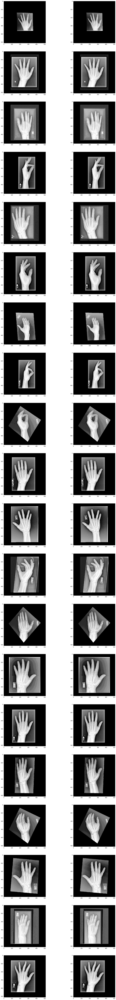

In [10]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

### 1.2.2 True Negative

In [11]:
true_negative = augmentation_df_1[augmentation_df_1['True label'] == 0].nsmallest(size_sample, 'Loss')
true_negative.style.set_properties(subset=['File name'], **{'width': '300px'})


,Unnamed: 0,Loss,True label,File name,Type
1297,1297,0.000728861,0,../../data/train/XR_HAND/patient05789/study1_negative/image1.png,end validation
708,708,0.000791926,0,../../data/train/XR_HAND/patient05789/study1_negative/image3.png,end validation
1238,1238,0.000871533,0,../../data/train/XR_HAND/patient10285/study1_negative/image2.png,end validation
305,305,0.000955444,0,../../data/train/XR_HAND/patient10285/study1_negative/image1.png,end validation
1073,1073,0.00102635,0,../../data/train/XR_HAND/patient10217/study1_negative/image3.png,end validation
627,627,0.00110717,0,../../data/train/XR_HAND/patient01113/study1_negative/image3.png,end validation
410,410,0.00111093,0,../../data/train/XR_HAND/patient11176/study1_negative/image3.png,end validation
223,223,0.00114854,0,../../data/train/XR_HAND/patient10163/study1_negative/image2.png,end validation
724,724,0.00118538,0,../../data/train/XR_HAND/patient10217/study1_negative/image1.png,end validation
1205,1205,0.00118749,0,../../data/train/XR_HAND/patient11140/study1_negative/image1.png,end validation


In [12]:
#files_true_negative_path = [x[3:] for x in true_negative['File name'] ]
files_true_negative_path = true_negative['File name'] 
files_true_negative = MURASubset(filenames=files_true_negative_path, transform=composed_transforms)

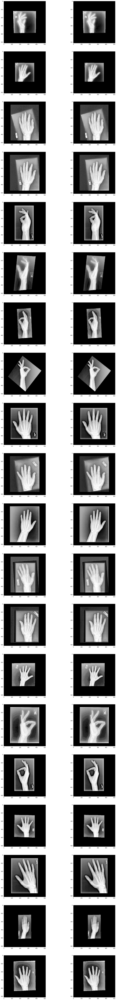

In [13]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_negative[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

### 1.2.3 False Positive

In [14]:
false_positive = augmentation_df_1[augmentation_df_1['True label'] == 0].nlargest(size_sample, 'Loss')
false_positive.style.set_properties(subset=['File name'], **{'width': '300px'})

,Unnamed: 0,Loss,True label,File name,Type
893,893,0.0216258,0,../../data/train/XR_HAND/patient10437/study1_negative/image1.png,end validation
204,204,0.0214916,0,../../data/train/XR_HAND/patient10709/study2_negative/image1.png,end validation
589,589,0.0196327,0,../../data/train/XR_HAND/patient04442/study1_negative/image1.png,end validation
216,216,0.0191253,0,../../data/train/XR_HAND/patient04442/study1_negative/image2.png,end validation
55,55,0.0176206,0,../../data/train/XR_HAND/patient11091/study1_negative/image3.png,end validation
649,649,0.0169426,0,../../data/train/XR_HAND/patient11115/study1_negative/image3.png,end validation
668,668,0.0138542,0,../../data/train/XR_HAND/patient10279/study1_negative/image2.png,end validation
947,947,0.013818,0,../../data/train/XR_HAND/patient10845/study1_negative/image2.png,end validation
961,961,0.0133651,0,../../data/train/XR_HAND/patient10845/study1_negative/image1.png,end validation
163,163,0.0116003,0,../../data/train/XR_HAND/patient11115/study1_negative/image2.png,end validation


In [15]:
#files_false_positive_path = [x[3:] for x in false_positive['File name'] ]
files_false_positive_path = false_positive['File name']
files_false_positive = MURASubset(filenames=files_false_positive_path, transform=composed_transforms)

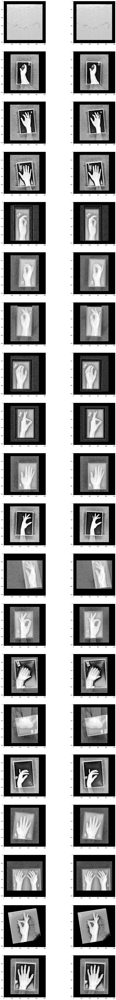

In [16]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_false_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

The images are missclassified because of:
 - black image without any hand
 - a lot of noise around the hand
 - complex labels that can not be reconstructed
 - some images have more rectangels around the hand
 - wired view on hand
 - hand in motion
 - brighness

### 1.2.4 True Positive

In [17]:
true_positive = augmentation_df_1[augmentation_df_1['True label'] == 1].nlargest(size_sample, 'Loss')
true_positive.style.set_properties(subset=['File name'], **{'width': '300px'})

,Unnamed: 0,Loss,True label,File name,Type
233,233,0.0363885,1,../../data/train/XR_HAND/patient09784/study1_positive/image4.png,end validation
1114,1114,0.0245671,1,../../data/train/XR_HAND/patient09798/study1_positive/image1.png,end validation
957,957,0.0214462,1,../../data/train/XR_HAND/patient09809/study1_positive/image2.png,end validation
633,633,0.0127985,1,../../data/train/XR_HAND/patient09798/study1_positive/image2.png,end validation
1111,1111,0.0110677,1,../../data/train/XR_HAND/patient10095/study1_positive/image2.png,end validation
451,451,0.0102927,1,../../data/train/XR_HAND/patient09424/study2_positive/image2.png,end validation
709,709,0.00948459,1,../../data/train/XR_HAND/patient09768/study1_positive/image2.png,end validation
338,338,0.00850519,1,../../data/train/XR_HAND/patient10025/study1_positive/image1.png,end validation
480,480,0.0082094,1,../../data/train/XR_HAND/patient09424/study2_positive/image1.png,end validation
783,783,0.00773404,1,../../data/train/XR_HAND/patient09846/study1_positive/image3.png,end validation


In [18]:
#files_true_positive_path = [x[3:] for x in true_positive['File name'] ]
files_true_positive_path = true_positive['File name']
files_true_positive = MURASubset(filenames=files_true_positive_path, transform=composed_transforms)

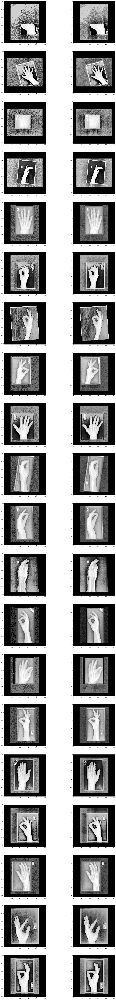

In [19]:
fig, ax = plt.subplots(nrows=size_sample, ncols=2, figsize=(20, 8*size_sample))

for i in range(size_sample):
    image_inp = files_true_positive[i]['image'][None,:,:,:]
    inp = image_inp.to(device)
    output = model(inp)
    
    ax[i, 0].imshow(image_inp.numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)
    ax[i, 1].imshow(output.cpu().detach().numpy()[0, 0, :, :], cmap='gray', vmin=0, vmax=1)

## 1.3 Loss per Epoch

In [20]:
augmentation_df_loss_1 = pd.read_csv(path_loss)
print(augmentation_df_loss_1)

     Unnamed: 0     train  validation
0             0  0.025784    0.030342
1             1  0.010477    0.015100
2             2  0.008600    0.011564
3             3  0.007427    0.009389
4             4  0.008045    0.008940
5             5  0.006131    0.008068
6             6  0.005852    0.007600
7             7  0.005083    0.007100
8             8  0.004820    0.006758
9             9  0.004974    0.006738
10           10  0.005544    0.006571
11           11  0.004358    0.006305
12           12  0.005230    0.006156
13           13  0.003996    0.005891
14           14  0.004495    0.005903
15           15  0.003484    0.005802
16           16  0.004114    0.005921
17           17  0.004167    0.005508
18           18  0.005119    0.006785
19           19  0.003524    0.005228
20           20  0.003455    0.005333
21           21  0.003772    0.005147
22           22  0.003827    0.005397
23           23  0.003661    0.005044
24           24  0.003308    0.005103
25          

Text(0.5, 1.0, 'Loss Augmentation: Flip')

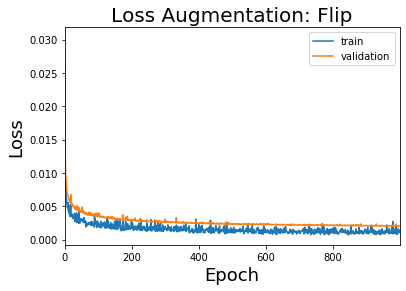

In [21]:
fig = augmentation_df_loss_1.plot.line(x = 'Unnamed: 0',
                                       y = ['train', 'validation'])
fig.set_xlabel('Epoch', fontsize=18)
fig.set_ylabel('Loss', fontsize=18)
fig.set_title('Loss Augmentation: Flip', fontsize=20)

The model seems not to overfit at 1000 epochs. It looks like the loss is still decreasing with some outliers. Maybe modify learning rate.